## Grand Canyon elevation classification using the NASADEM dataset

In this tutorial we'll demonstrate how to classify the terrain elevations [//shouldn't this be plural?//] of the Grand Canyon, an area of interest roughly covering the Grand Canyon National Park. The data that will be used is hosted on the [Microsoft Planetary Computer Data Catalog](https://planetarycomputer.microsoft.com/catalog). The data set is called [NASADEM](https://github.com/microsoft/AIforEarthDatasets#nasadem).

The [NASADEM](https://github.com/microsoft/AIforEarthDatasets#nasadem) dataset provides global topographic data at 1 arc-second (~30m) horizontal resolution, derived primarily from data captured via the [Shuttle Radar Topography Mission](https://www2.jpl.nasa.gov/srtm/) (SRTM). The data is stored on Azure Storage in [cloud-optimized GeoTIFF](https://www.cogeo.org/) format.

You will use different methods of [xarray spatial](https://xarray-spatial.org/) to classify data into sets. Specifically, this tutorial will walk you through:
- Loading and rendering the area of interest image using the Grand Canyon's coordinates.
- Classifying the data using xarray spatial's [natural breaks](https://xarray-spatial.org/reference/_autosummary/xrspatial.classify.natural_breaks.html), [equal interval](https://xarray-spatial.org/reference/_autosummary/xrspatial.classify.equal_interval.html), and [quantile](https://xarray-spatial.org/reference/_autosummary/xrspatial.classify.quantile.html) methods.
- Reclassifying the data using xarray spatial's [reclassify](https://xarray-spatial.org/reference/_autosummary/xrspatial.classify.reclassify.html) function.

### Loading the area of interest image

To load the image and build the full URL, we'll use a helpful function demonstrated on [Accessing NASADEM data on Azure (NetCDF)](https://github.com/microsoft/AIforEarthDataSets/blob/main/data/nasadem-nc.ipynb).

In [1]:
import requests

nasadem_blob_root = "https://nasademeuwest.blob.core.windows.net/nasadem-cog/v001/"
nasadem_file_index_url = nasadem_blob_root + "index/nasadem_cog_list.txt"
nasadem_content_extension = ".tif"
nasadem_file_prefix = "NASADEM_HGT_"
nasadem_file_list = None

nasadem_file_list = requests.get(nasadem_file_index_url).text.split("\n")

In [2]:
import math


def get_nasadem_filename(coord):
    """
    Get the NASADEM filename for a specified latitude and longitude.
    """
    lat = coord[0]
    lon = coord[1]

    ns_token = "n" if lat >= 0 else "s"
    ew_token = "e" if lon >= 0 else "w"

    lat_index = abs(math.floor(lat))
    lon_index = abs(math.floor(lon))

    lat_string = ns_token + "{:02d}".format(lat_index)
    lon_string = ew_token + "{:03d}".format(lon_index)

    filename = nasadem_file_prefix + lat_string + lon_string + nasadem_content_extension

    if filename not in nasadem_file_list:
        print("Lat/lon {},{} not available".format(lat, lon))
        filename = None

    return filename

In [3]:
grand_canyon_coord = [36.101690, -112.107676]

url = nasadem_blob_root + get_nasadem_filename(grand_canyon_coord)

Now that we have the image URL, we can use the xarray [open_rasterio](http://xarray.pydata.org/en/stable/generated/xarray.open_rasterio.html) function to load the data. At the same time, we also drop the band dimension.

In [4]:
import xarray as xr

img_arr = xr.open_rasterio(url).squeeze().drop("band")

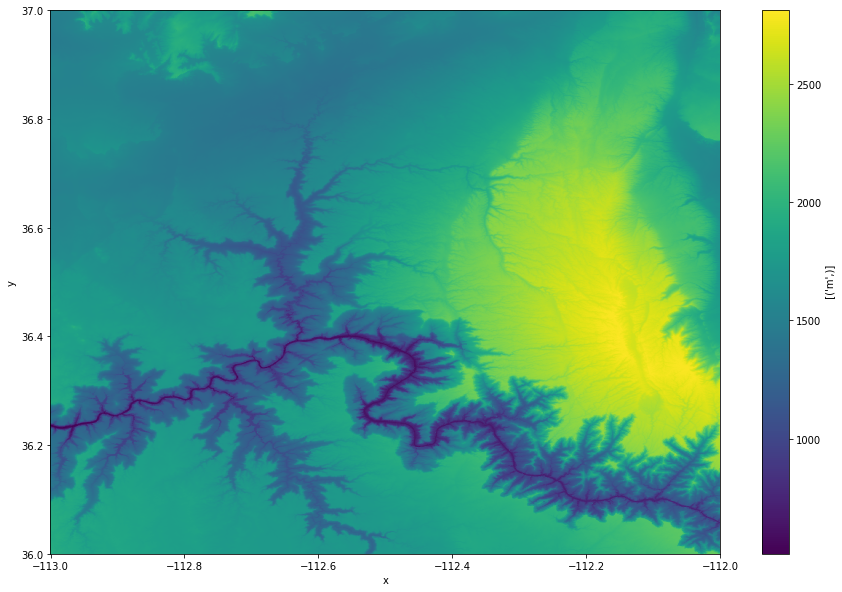

In [5]:
img_arr.plot.imshow(figsize=(15, 10))

### Classifying elevation data

#### Classifying with `natural_breaks`

The [natural breaks](https://xarray-spatial.org/reference/_autosummary/xrspatial.classify.natural_breaks.html), [equal interval](https://xarray-spatial.org/reference/_autosummary/xrspatial.classify.equal_interval.html) function classifies the data using the [Jenks Natural Breaks Classification](http://wiki.gis.com/wiki/index.php/Jenks_Natural_Breaks_Classification) method. This method is designed to optimize the arrangement of a set of values into natural classes that are found naturally in a data set.

In [6]:
from xrspatial.classify import natural_breaks

natural_breaks_agg = natural_breaks(img_arr, num_sample=20000, k=15)

To shade the classified data, we will use xarray-spatial's [hillshade](https://xarray-spatial.org/reference/_autosummary/xrspatial.hillshade.hillshade.html?highlight=hillshade) function. This will create a raster illumination based on altitude to highlight the Grand Canyon's different elevation levels.

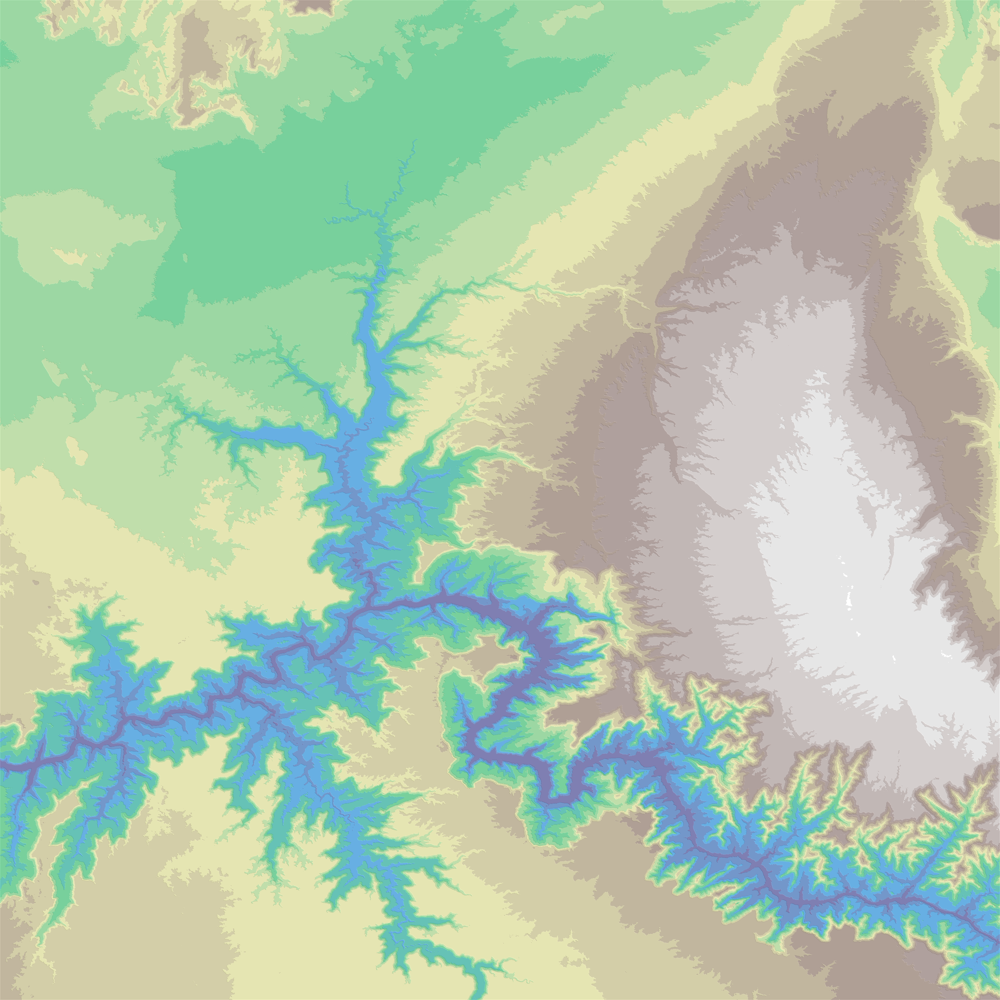

In [7]:
from datashader.transfer_functions import shade, stack
import matplotlib.pyplot as plt
from xrspatial import hillshade

stack(
    shade(
        hillshade(natural_breaks_agg), cmap=["gray", "white"], alpha=255, how="linear"
    ),
    shade(natural_breaks_agg, cmap=plt.get_cmap("terrain"), alpha=128, how="linear"),
)

As we can see in the image above, the different elevation levels of the Grand Canyon are now identified by colors. Each color represents a set of the classified data. For instance, the wild blue yonder color areas have the smallest elevation with ≈700m of altitude, the tan brown color areas have ≈1700m of elevation, and the blue-grey color areas represent the highest elevations with ≈2500m of altitude.

#### Classifying with `equal_interval`

Using the [equal interval](https://xarray-spatial.org/reference/_autosummary/xrspatial.classify.equal_interval.html) function, we can classify data into sets based on intervals of equal width. This method is useful in cases where we want to emphasize the amount of an attribute value relative to the other values.

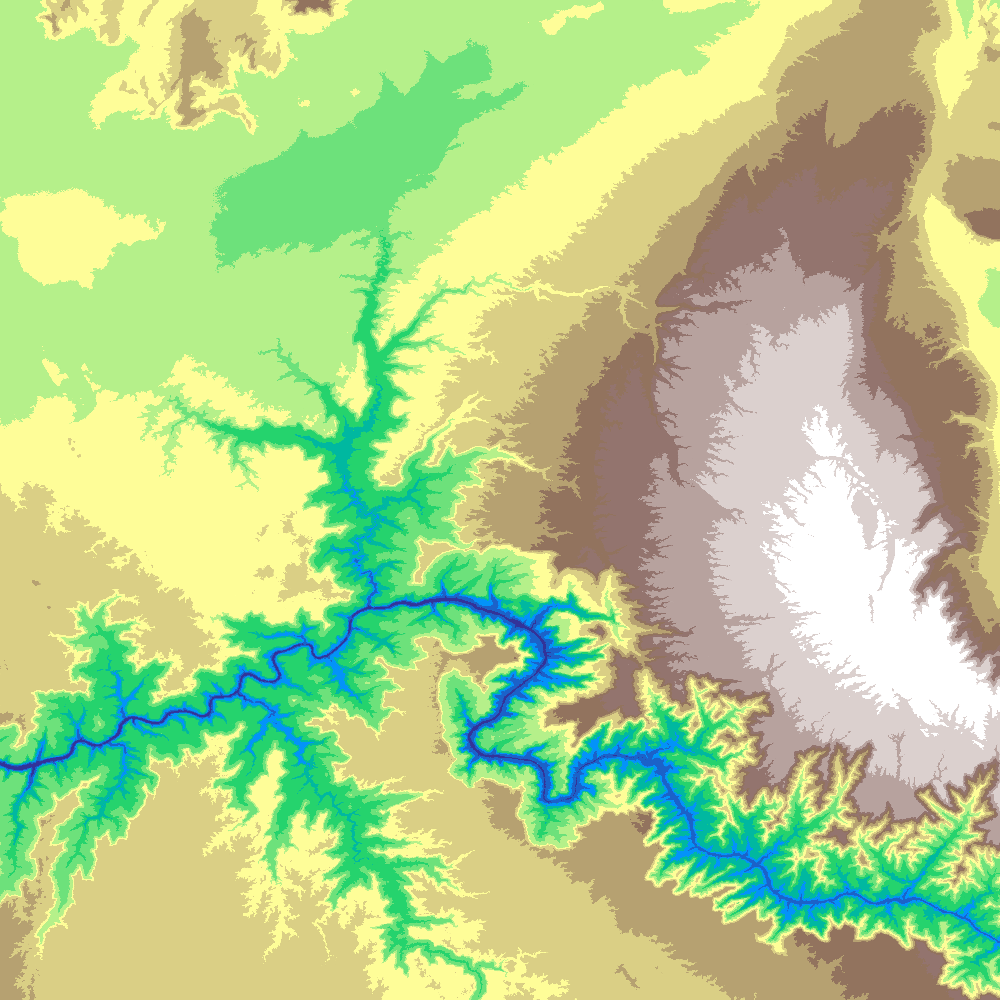

In [8]:
from xrspatial.classify import equal_interval

equal_interval_agg = equal_interval(img_arr, k=15)

shade(equal_interval_agg, cmap=plt.get_cmap("terrain"), how="linear")

#### Classifying with `quantile`

The [quantile](https://xarray-spatial.org/reference/_autosummary/xrspatial.classify.quantile.html) function classifies data based on quantile groups of equal size. Each class contains the same amount of data points.

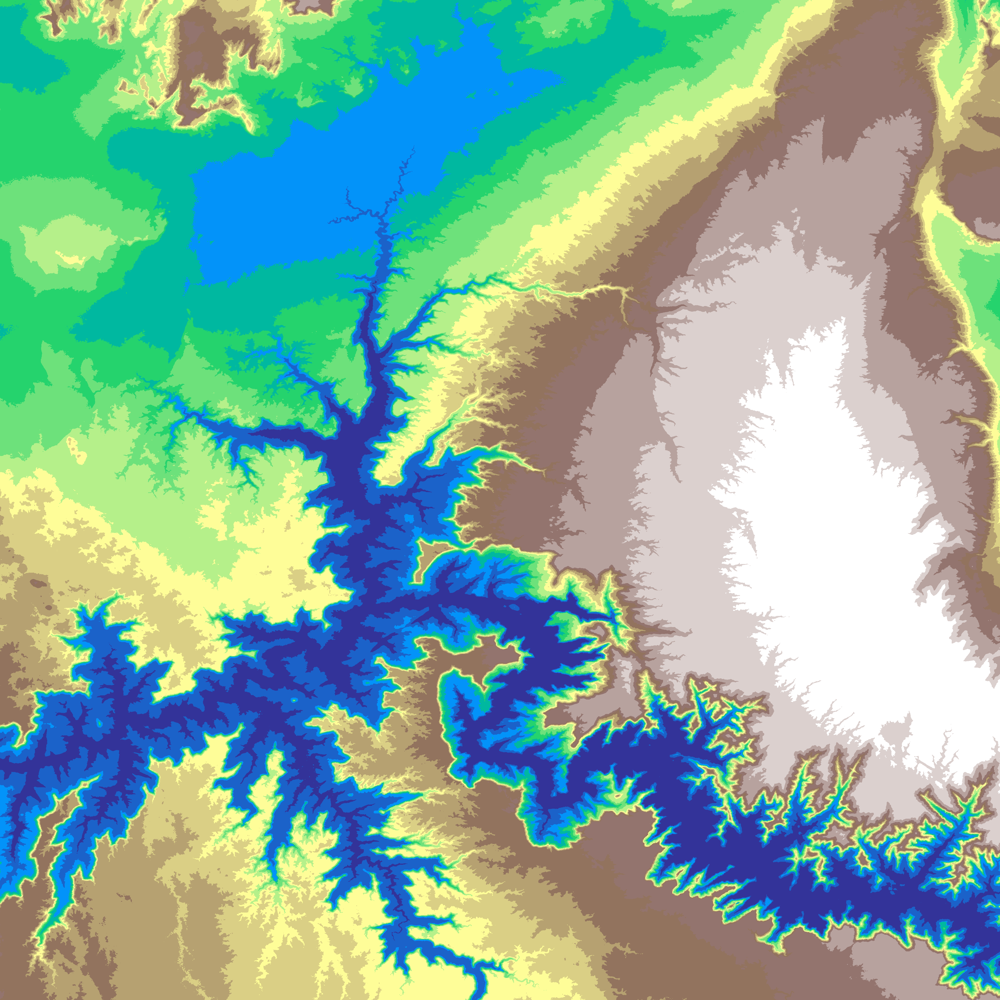

In [9]:
from xrspatial.classify import quantile

quantile_agg = quantile(img_arr, k=15)

shade(quantile_agg, cmap=plt.get_cmap("terrain"), how="linear")

### Using custom bins with `reclassify`

Using the [reclassify](https://xarray-spatial.org/reference/_autosummary/xrspatial.classify.reclassify.html) function, we can classify the data into sets based on user-defined bins. This allows us to highlight specific areas. For instance, let's highlight the area that has an elevation greater than 2500 meters.

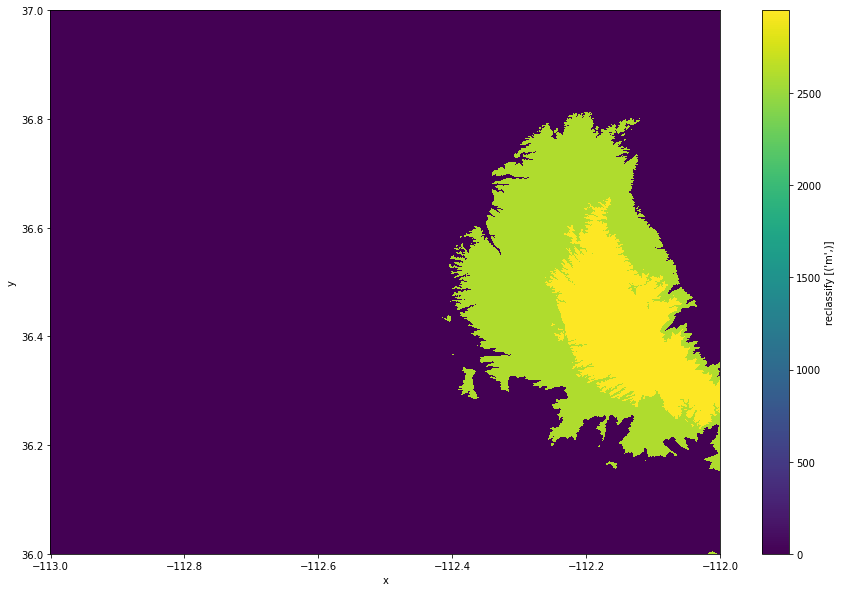

In [10]:
from xrspatial.classify import reclassify

bins = range(150, 5200, 350)
new_vals = [val if val > 2500 else 0 for val in bins]

reclass_agg = reclassify(
    agg=img_arr,
    bins=bins,
    new_values=new_vals,
)

reclass_agg.plot.imshow(figsize=(15, 10))